In [1]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

%matplotlib inline

## Monte-Carlo Model

### Empirical CDF/PDF

Sample mean: 0.09071814679867113 
Sample var: 0.9006170170892949


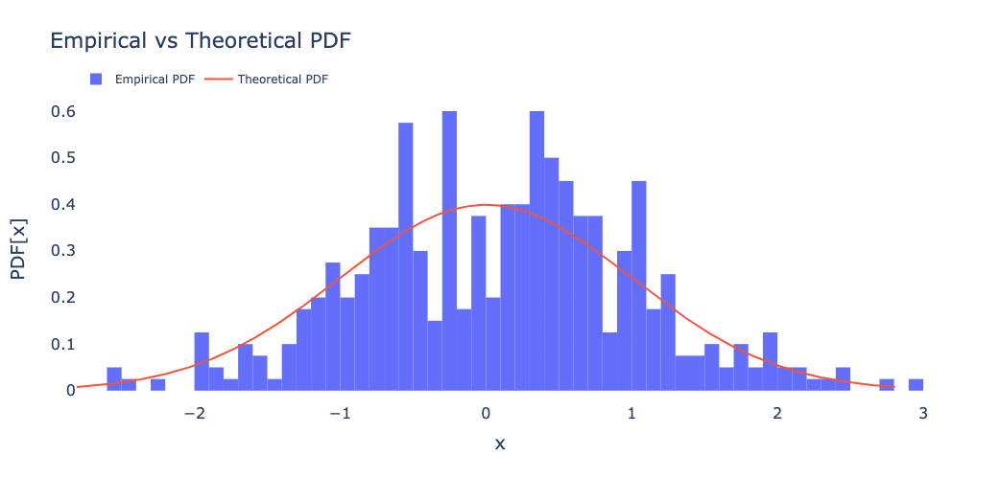

In [2]:
from scipy import stats

np.random.seed(113)
sample_normal = np.random.normal(0, 1, 400)

print(
    f"Sample mean: {sample_normal.mean()}",
    f"\nSample var: {sample_normal.var()}",
)

## How much of PDF we want to plot
percentage = 0.995
x = np.linspace(
    start = stats.norm.ppf((1-percentage)/2), 
    stop = stats.norm.ppf(1 - (1-percentage)/2), 
    num = 500
)
## Creating Normal Distribution Theoretical PDF
y = stats.norm.pdf(x)


## Adding Empirical Histogram
fig=go.Figure()
fig.add_trace(go.Histogram(
    x=sample_normal,
    xbins=dict(size=0.1),
    histnorm="probability density",
    name="Empirical PDF"
))

## Adding Theoretical Curve
fig.add_trace(go.Scatter(
    x=x,
    y=y,
    name="Theoretical PDF"
))

## Update background to full transparency
## Axis Naming & Text Scaling
fig.update_layout(
    title="Empirical vs Theoretical PDF",
    xaxis_title="x",
    yaxis_title="PDF[x]",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)
fig.show()

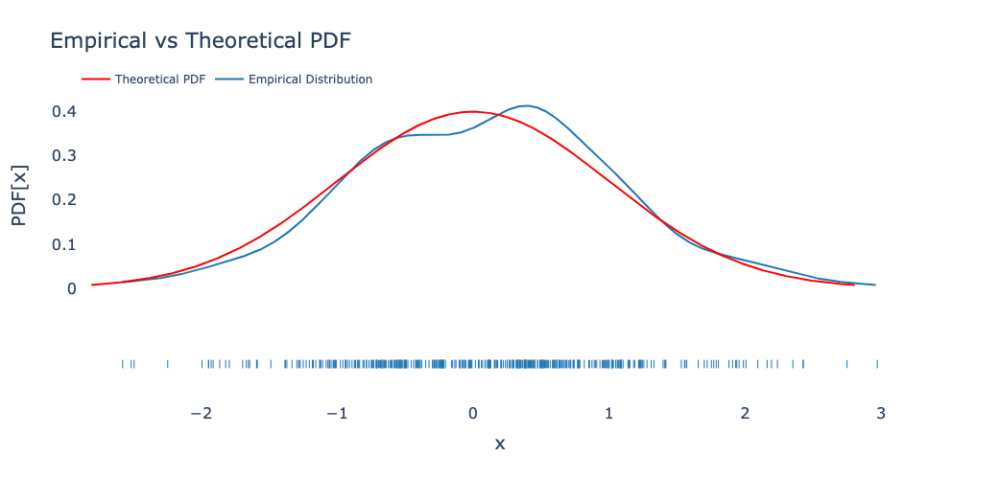

In [3]:
import plotly.figure_factory as ff
fig = ff.create_distplot(
    [sample_normal], 
    ["Empirical Distribution"],
    show_hist=False
)

fig.add_trace(go.Scatter(
    x=x,
    y=y,
    name="Theoretical PDF",
    line=dict(color='red')
))

fig.update_layout(
    title="Empirical vs Theoretical PDF",
    xaxis_title="x",
    yaxis_title="PDF[x]",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)
fig.show()

## Stochastic Dominance

### Same Distributions

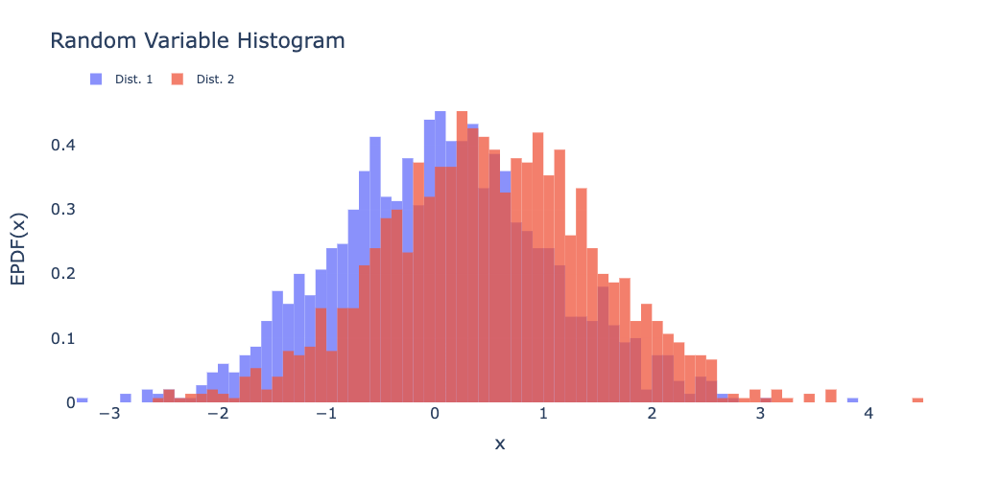

In [4]:
np.random.seed(42)

## Sample Distribution Parameters
sample_size = 1500
norm_loc = 0
norm_scale = 1

## Generating data
sample_1 = np.random.normal(loc=norm_loc, scale=norm_scale, size=sample_size)
## Second sample has expected value difference of 0.5
sample_2 = np.random.normal(loc=norm_loc+0.5, scale=norm_scale, size=sample_size)

## Plotting histograms/EPDF
fig = go.Figure(go.Histogram(
    x=sample_1,
    name="Dist. 1"
))

fig.add_trace(go.Histogram(
    x=sample_2,
    name="Dist. 2"
))


## Making visual changes to axes 
fig.update_traces(
    opacity=0.75, 
    xbins=dict(size=0.1),
    histnorm="probability density"
)
fig.update_layout(
    title="Random Variable Histogram",
    barmode='overlay',
    xaxis_title="x",
    yaxis_title="EPDF(x)",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)

fig.show()

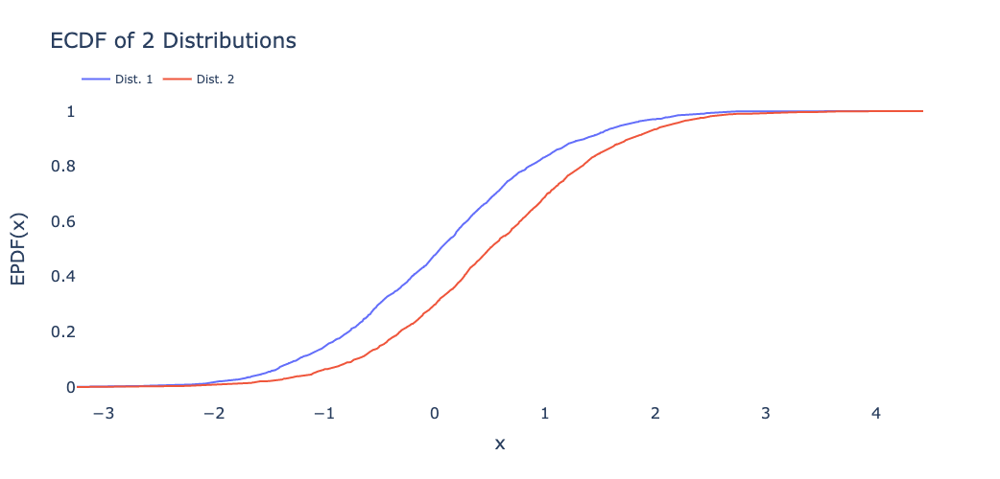

In [5]:
from statsmodels.distributions.empirical_distribution import ECDF

## Calculating ECDF for Exponential Distribution
x = sorted(sample_1)
y = ECDF(sample_1)(x)

## Insert the start of Normal Distribution
## And make ECDF of our array at 0
x.append(sample_2.max())
y = np.append(y, 1)

fig = go.Figure(go.Scatter(
    x=x,
    y=y,
    name="Dist. 1"
))


## Same goes for Normal Distribution
x = sorted(sample_2)
y = ECDF(sample_2)(x)

## Insert the start of Normal Distribution
## And make ECDF of our array at 0
x.insert(0, sample_1.min())
y = np.insert(y, 0, 0)

fig.add_trace(go.Scatter(
    x=x,
    y=y,
    name="Dist. 2"
))

fig.update_layout(
    title="ECDF of 2 Distributions",
    xaxis_title="x",
    yaxis_title="EPDF(x)",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)

fig.show()

### Different Distribution

Normal Mean: 1.7816 
Exponential Mean: 1.9795 

Normal Median: 1.78 
Exponential Median: 1.3863


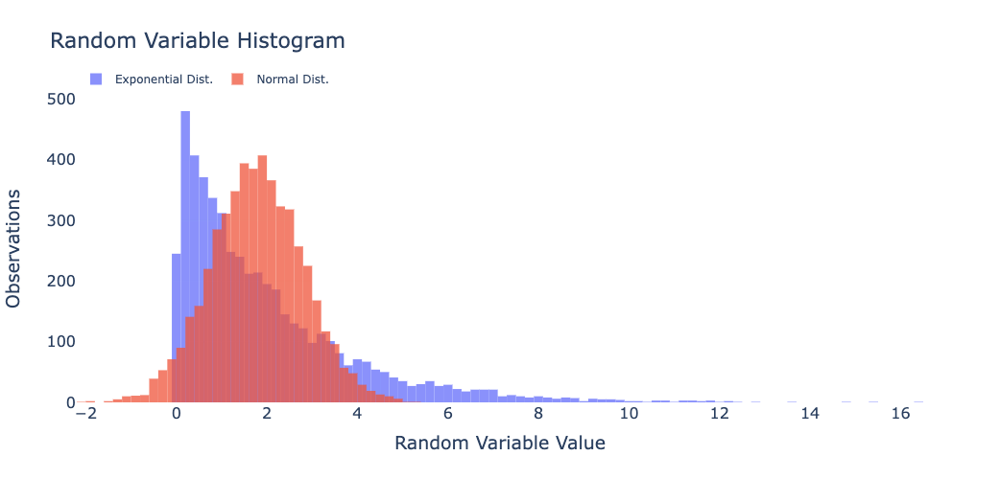

In [6]:
np.random.seed(42)

## Sample Distribution Parameters
sample_size = 5000
exp_scale = 2

norm_loc = (1*exp_scale)*0.9
norm_scale = 1


## Generating samples
sample_exp = np.random.exponential(scale=exp_scale, size=sample_size)
sample_norm = np.random.normal(loc=norm_loc, scale=norm_scale, size=sample_size)


## Basic plots rendering
fig = go.Figure(go.Histogram(
    x=sample_exp,
    name="Exponential Dist."
))

fig.add_trace(go.Histogram(
    x=sample_norm,
    name="Normal Dist."
))


## Making visual changes to axes 
fig.update_traces(opacity=0.75, xbins=dict(size=0.2))
fig.update_layout(
    title="Random Variable Histogram",
    barmode='overlay',
    xaxis_title="Random Variable Value",
    yaxis_title="Observations",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)

norm_mean = np.mean(sample_norm)
norm_median = np.median(sample_norm)
exp_mean = np.mean(sample_exp)
exp_median = np.median(sample_exp)

print(
    f"Normal Mean: {round(norm_mean, 4)}",
    f"\nExponential Mean: {round(exp_mean, 4)}",
    f"\n\nNormal Median: {round(norm_median, 4)}",
    f"\nExponential Median: {round(exp_median, 4)}"
)

fig.show()

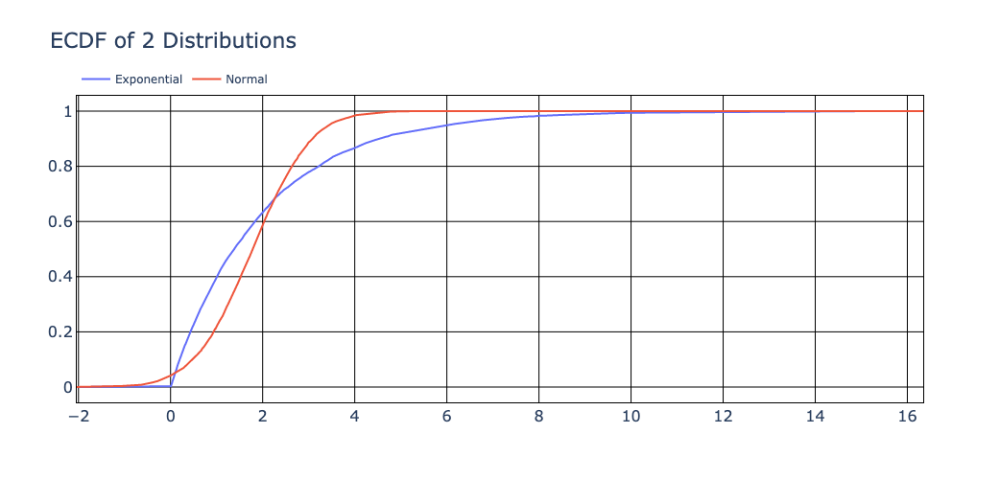

In [7]:
from statsmodels.distributions.empirical_distribution import ECDF

## Calculating ECDF for Exponential Distribution
x = sorted(sample_exp)
y = ECDF(sample_exp)(x)

## Insert the start of Normal Distribution
## And make ECDF of our array at 0
x.insert(0, sample_norm.min())
y = np.insert(y, 0, 0)

fig = go.Figure(go.Scatter(
    x=x,
    y=y,
    name="Exponential"
))


## Same goes for Normal Distribution
x = sorted(sample_norm)
y = ECDF(sample_norm)(x)

## Insert the start of Normal Distribution
## And make ECDF of our array at 0
x.append(sample_exp.max())
y = np.append(y, 1)

fig.add_trace(go.Scatter(
    x=x,
    y=y,
    name="Normal"
))

fig.update_layout(
    title="ECDF of 2 Distributions",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    xaxis=dict(
        gridcolor="black", 
        zerolinecolor="black",
        zerolinewidth=1,
        mirror=True,
        linecolor="black",
        showline=True,
    ),
    yaxis=dict(
        gridcolor="black", 
        zerolinecolor="black",
        zerolinewidth=1,
        linecolor="black",
        showline=True,
        mirror=True
    ),
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)

fig.show()

Обратим внимание, что:
- Тест Стьюдента принимает гипотезу с альтернативой «Less»
- Тест Манна-Уитни отвергает гипотезу с альтернативой «Less»
- Критерий Колмогорова-Смирнова отвергает гипотезу <b>в обе стороны</b>

Из этого можно сделать следующий вывод: 
1. Выборочное среднее первого массива (экспоненциального распределения) <b>не меньше</b>, чем второго (нормального)
2. Большее кол-во элементов нормального распределения лежит «правее» (так как гипотеза Less принята по отношению к экспоненциальному распределению)
3. Статистика Колмогорова-Смирнова достаточно большая в <i>обе стороны</i>. То есть, на разных участках кривой доминирует разная функция

In [8]:
from scipy.stats import mannwhitneyu, ttest_ind, ks_2samp, kstest

stat, p_value = mannwhitneyu(x=sample_exp, y=sample_norm, alternative="less")
print(f"Mann Whitney H1: Less, p-value = {p_value}")

stat, p_value = mannwhitneyu(x=sample_exp, y=sample_norm, alternative="greater")
print(f"Mann Whitney H1: Greater, p-value = {p_value}")

stat, p_value = ttest_ind(a=sample_exp, b=sample_norm, alternative="less")
print(f"\nStudent t-test H1: Less, p-value = {p_value}")

stat, p_value = ks_2samp(data1=sample_exp, data2=sample_norm, alternative="less")
print(f"\nKS-Test H1: Less, p-value = {p_value}")

stat, p_value = ks_2samp(data1=sample_exp, data2=sample_norm, alternative="greater")
print(f"KS-Test H1: Greater, p-value = {p_value}")

Mann Whitney H1: Less, p-value = 9.326375152719643e-16
Mann Whitney H1: Greater, p-value = 0.9999999999999991

Student t-test H1: Less, p-value = 0.999999999844415

KS-Test H1: Less, p-value = 4.5399840281965064e-35
KS-Test H1: Greater, p-value = 2.4687844171024033e-74


### Student's t-statistic distribution under the Null Hypothesis

KS-test p-value = 0.09702668551030112


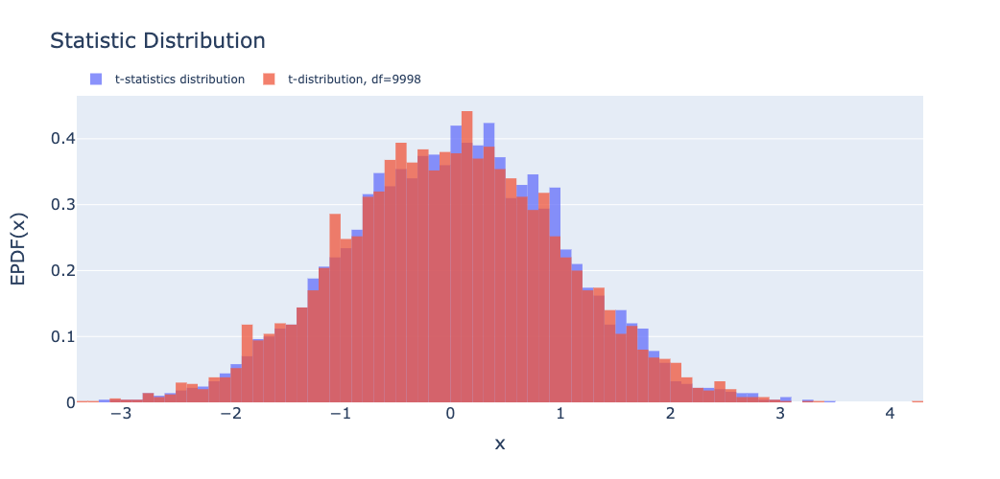

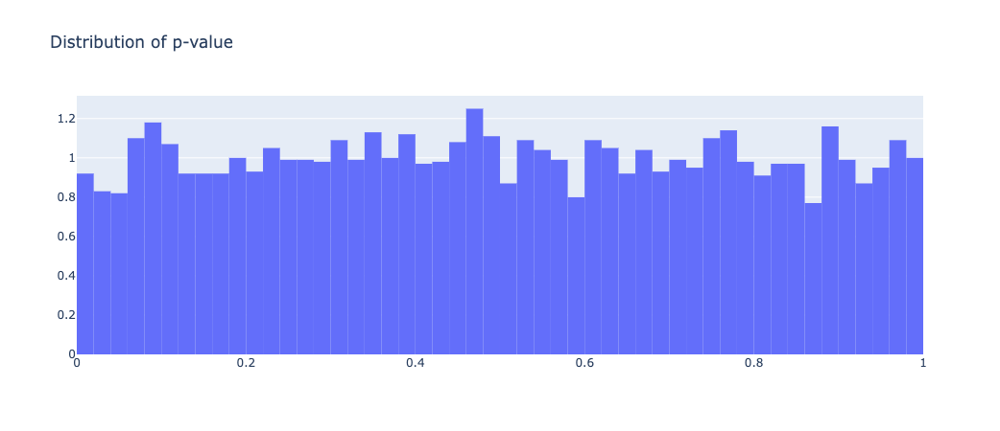

In [9]:
statistics = []
p_values = []
sample_length = len(sample_exp)

## Generating 5k statistics
for i in range(0, 5000):
    stat, p = ttest_ind(
        a=np.random.choice(sample_exp, sample_length),
        b=np.random.choice(sample_exp, sample_length)
    )
    
    statistics.append(stat)
    p_values.append(p)

    
########################
## t-values distribution
########################
fig = go.Figure(go.Histogram(
    x=statistics,
    name="t-statistics distribution"
)).update_layout(
    title="Distribution of t-statistics"
)

## Goodness of fit test
## H0 – statistics has standart Student Distribution
sample = np.random.standard_t(df=sample_length*2-2, size=5000)
s, p = kstest(rvs=statistics, cdf=sample)
print(f"KS-test p-value = {p}")

fig.add_trace(go.Histogram(
    x=sample,
    name=f"t-distribution, df={sample_length*2-2}"
))

fig.update_traces(
    opacity=0.75, 
    xbins=dict(size=0.1),
    histnorm="probability density"
)

fig.update_layout(
    title="Statistic Distribution",
    barmode='overlay',
    xaxis_title="x",
    yaxis_title="EPDF(x)",
    font=dict(size=16),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
).show()


########################
## P-values distribution
########################
go.Figure(go.Histogram(
    x=p_values,
    histnorm="probability density"
)).update_layout(
    title="Distribution of p-value"
).show()

del stat, s, p, i

### Student's t-statistic distribution with rejected Null Hypothesis

KS-test p-value = 0.0


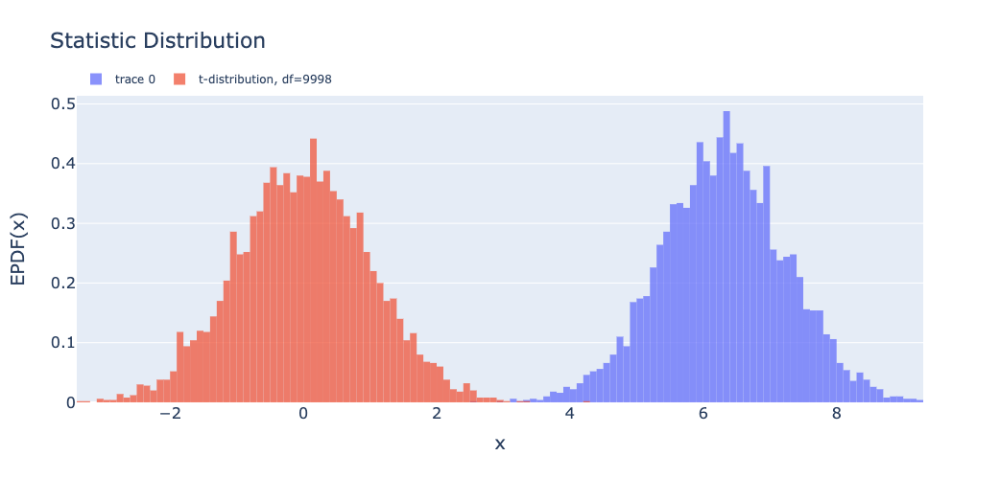

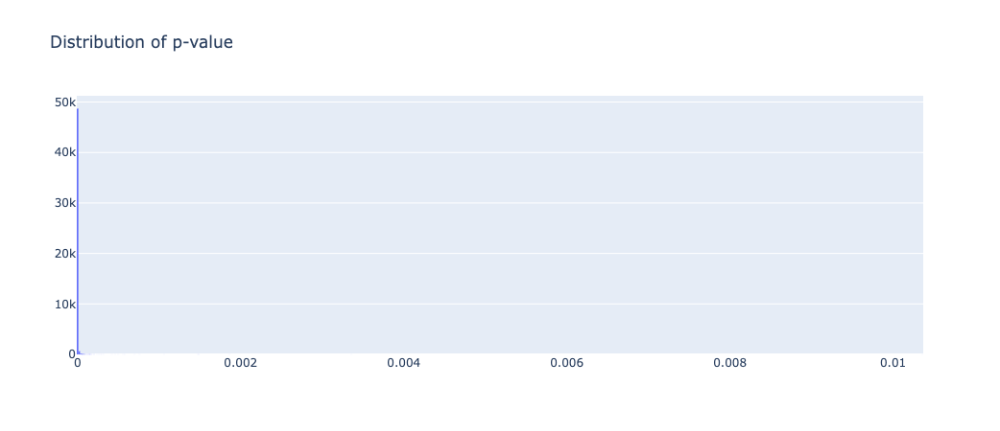

In [10]:
statistics = []
p_values = []
sample_length_exp = len(sample_exp)
sample_length_norm = len(sample_norm)

for i in range(0, 5000):
    stat, p = ttest_ind(
        a=np.random.choice(sample_exp, sample_length_exp),
        b=np.random.choice(sample_norm, sample_length_norm)
    )
    
    statistics.append(stat)
    p_values.append(p)

    
########################
## t-values Distribution
########################
fig=go.Figure(go.Histogram(
    x=statistics,
    histnorm="probability density"
)).update_layout(
    title="Distribution of t-statistics"
)

## Goodness of Fit Test
s, p = kstest(rvs=statistics, cdf=sample)
print(f"KS-test p-value = {p}")

fig.add_trace(go.Histogram(
    x=sample,
    name=f"t-distribution, df={sample_length*2-2}"
))

fig.update_traces(
    opacity=0.75, 
    xbins=dict(size=0.1),
    histnorm="probability density"
)

fig.update_layout(
    title="Statistic Distribution",
    barmode='overlay',
    xaxis_title="x",
    yaxis_title="EPDF(x)",
    font=dict(size=16),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
).show()


########################
## P-values distribution
########################
go.Figure(go.Histogram(
    x=p_values,
    histnorm="probability density"
)).update_layout(
    title="Distribution of p-value"
).show()

del stat, s, p, i

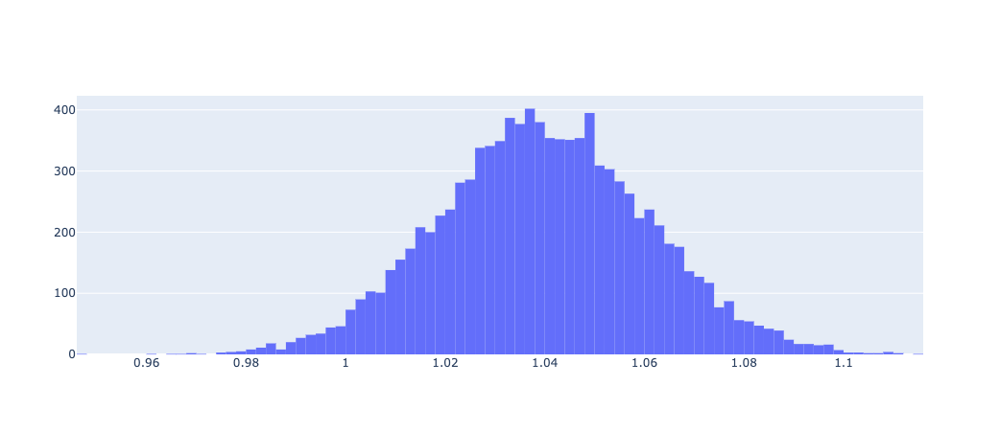

In [11]:
sample_size = len(sample_norm)
array = []

for _ in range(0, 10000):
    value = np.random.choice(sample_norm, size=sample_size, replace=True)
    value = np.var(value)
    array.append(value)

fig = go.Figure(go.Histogram(x=array, name="Norm. Sampled Variance"))


# array = np.random.chisquare(df=sample_size-1, size=10000)
# fig.add_trace(go.Histogram(x=array, name="Chi-Square Dist."))

# fig.update_traces(
#     opacity=0.75, 
#     xbins=dict(size=0.1),
#     histnorm="probability density"
# )

# fig.update_layout(
#     title="Statistic Distribution",
#     barmode='overlay',
#     xaxis_title="x",
#     yaxis_title="EPDF(x)",
#     font=dict(size=16),
#     width=1000,
#     height=500,
#     legend=dict(orientation="h", y=1.1, font=dict(size=12))
# )

fig.show()

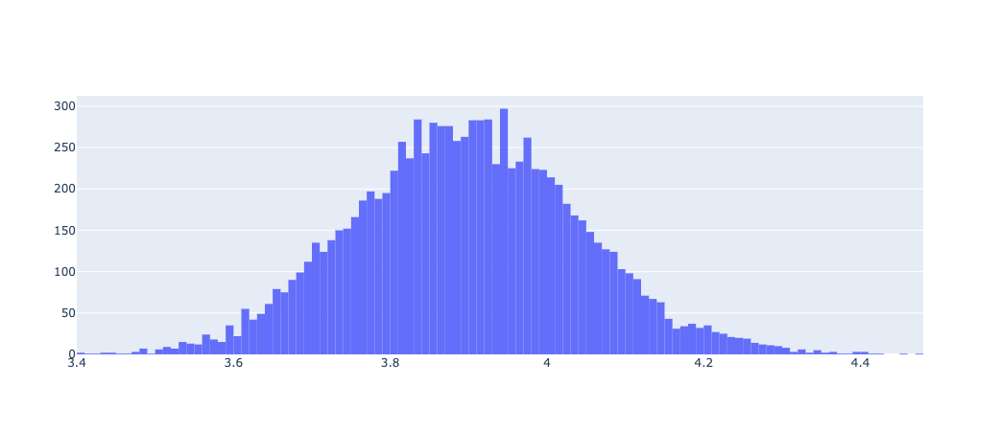

In [12]:
sample_size = len(sample_exp)
array = []

for _ in range(0, 10000):
    value = np.random.choice(sample_exp, size=sample_size, replace=True)
    value = np.var(value)
    array.append(value)

fig = go.Figure(go.Histogram(x=array, name="Sampled Variance"))


# array = np.random.chisquare(df=sample_size-1, size=10000)
# fig.add_trace(go.Histogram(x=array, name="Chi-Square Dist."))

# fig.update_traces(
#     opacity=0.75, 
#     xbins=dict(size=0.1),
#     histnorm="probability density"
# )

# fig.update_layout(
#     title="Statistic Distribution",
#     barmode='overlay',
#     xaxis_title="x",
#     yaxis_title="EPDF(x)",
#     font=dict(size=16),
#     width=1000,
#     height=500,
#     legend=dict(orientation="h", y=1.1, font=dict(size=12))
# )

fig.show()

### Mann Whitney U-statistic Distribution under Null Hypothesis

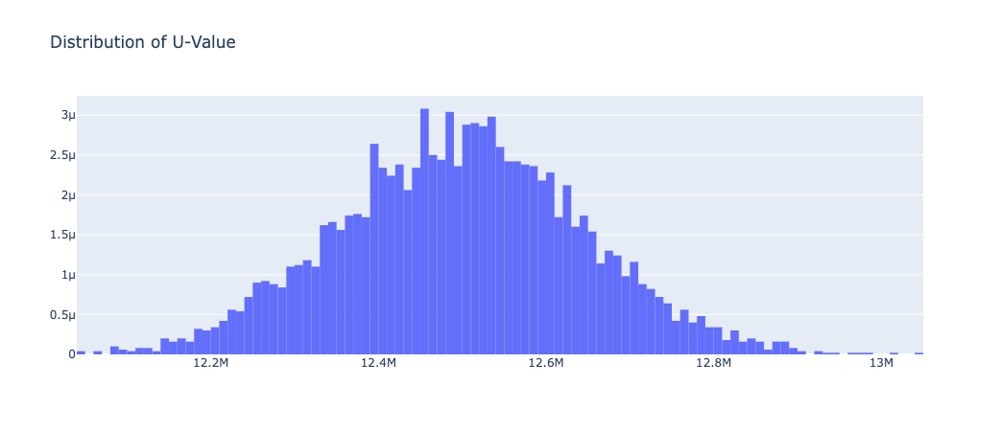

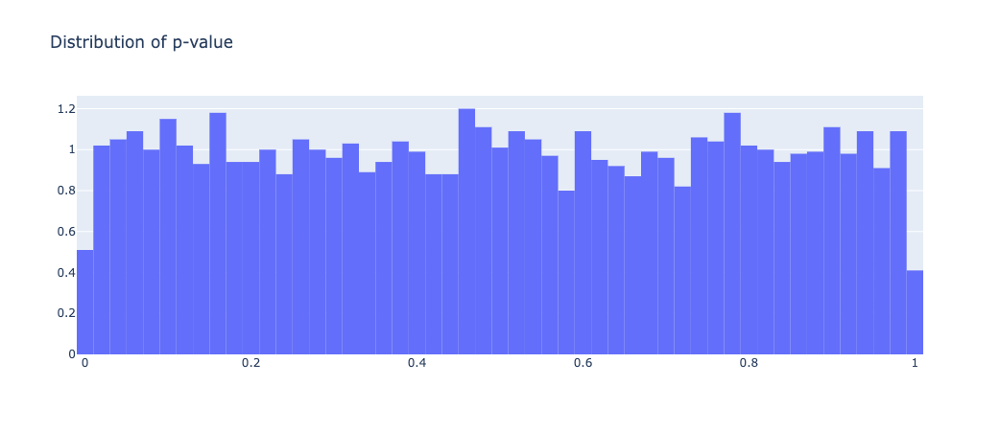

In [13]:
statistics = []
p_values = []
sample_length = len(sample_norm)

for i in range(0, 5000):
    stat, p = mannwhitneyu(
        x=np.random.choice(sample_norm, sample_length),
        y=np.random.choice(sample_norm, sample_length),
    )
    
    statistics.append(stat)
    p_values.append(p)

    
## U-values distribution
go.Figure(go.Histogram(
    x=statistics,
    histnorm="probability density"
)).update_layout(
    title="Distribution of U-Value"
).show()


## P-values distribution
go.Figure(go.Histogram(
    x=p_values,
    histnorm="probability density"
)).update_layout(
    title="Distribution of p-value"
).show()

del stat, p, i

In [14]:
from scipy.stats import kstest, anderson

## Null Hypothesis is accepted and U-distribution is, in fact, Normal
print(anderson(x=statistics, dist="norm"))

## Null Hypothesis is accepted and p-values distributed Uniformly
## Thus, meaning that Null Hypothesis of original test is correct
print(kstest(
    rvs=p_values, 
    cdf=np.random.uniform(low=0, high=1, size=50000)
))

AndersonResult(statistic=0.2513894493413318, critical_values=array([0.576, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.00954000000000002, pvalue=0.7987849011353964)


### Mann Whitney U-statistic Distribution with rejected Null Hypothesis

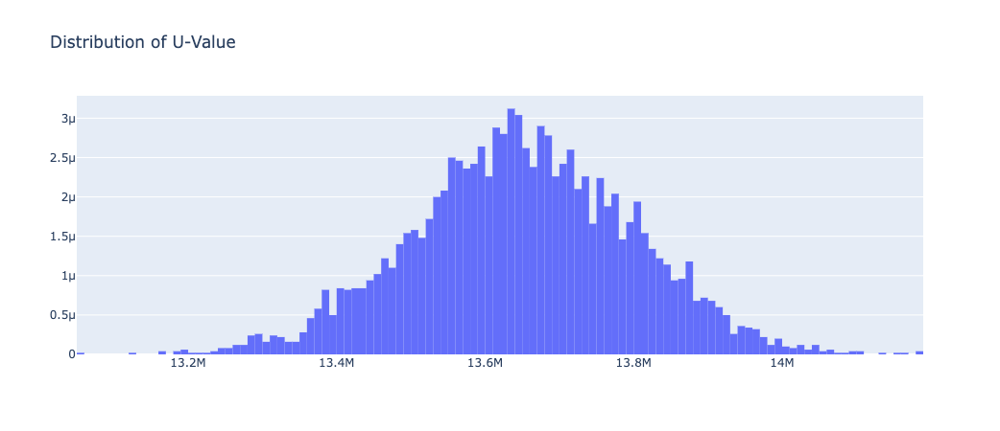

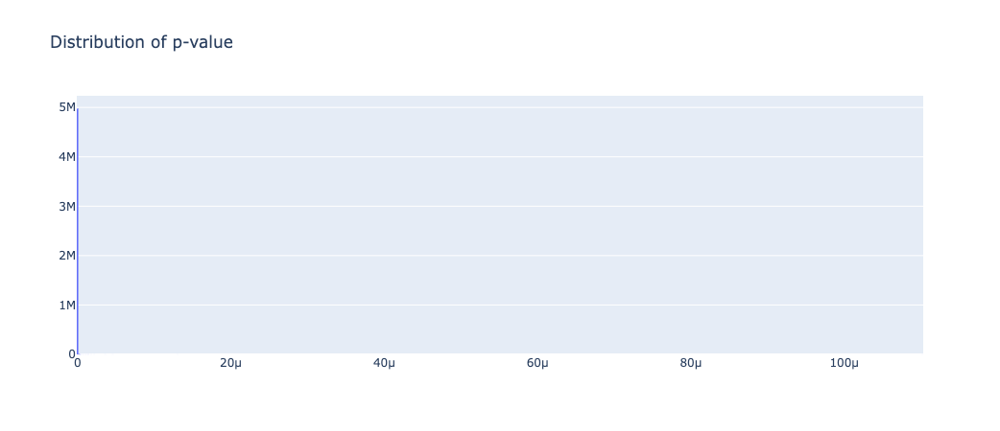

In [15]:
statistics = []
p_values = []
sample_length = len(sample_norm)

for i in range(0, 5000):
    stat, p = mannwhitneyu(
        x=np.random.choice(sample_norm, sample_length),
        y=np.random.choice(sample_exp, sample_length),
    )
    
    statistics.append(stat)
    p_values.append(p)

    
## U-values distribution
go.Figure(go.Histogram(
    x=statistics,
    histnorm="probability density"
)).update_layout(
    title="Distribution of U-Value"
).show()


## P-values distribution
go.Figure(go.Histogram(
    x=p_values,
    histnorm="probability density"
)).update_layout(
    title="Distribution of p-value"
).show()

del stat, p, i

In [16]:
from scipy.stats import kstest, anderson

## Null Hypothesis is accepted and U-distribution is, in fact, Normal
print(anderson(x=statistics, dist="norm"))

## Null hypothesis is rejected since P-values are distribution not Uniformly
print(kstest(
    rvs=p_values, 
    cdf=np.random.uniform(low=0, high=1, size=50000)
))

AndersonResult(statistic=0.539199342098982, critical_values=array([0.576, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.99984, pvalue=0.0)


## ECDF Estimation

### Kolmogorov Statistic

KstestResult(statistic=0.07056521936253157, pvalue=0.03544686446531353)


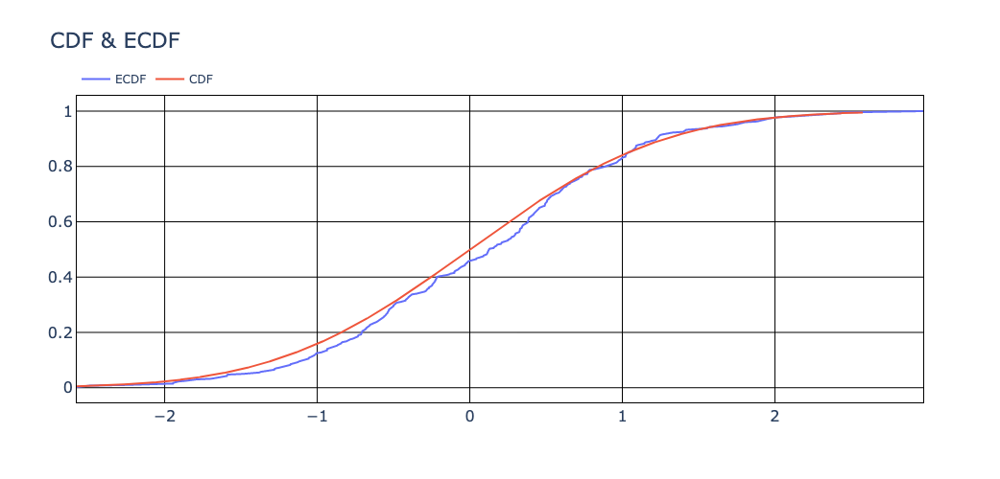

In [17]:
from scipy.stats import norm
from scipy.stats import kstest

np.random.seed(113)
sample_size = 400

## Generating Standard Normal Distribution
sample = np.random.normal(loc=0, scale=1, size=sample_size)

x = sorted(sample)
y = ECDF(sample)(x)

## Creating Figure with ECDF trace
fig = go.Figure(go.Scatter(
    x=x,
    y=y,
    name="ECDF"
))

## Calculating Theoretical CDF
quantile = 0.01
x = np.linspace(
    start=norm.ppf(quantile/2), 
    stop=norm.ppf(1-(quantile/2)),
    num=2000
)
y = norm.cdf(x)

## Adding CDF trace 
fig.add_trace(go.Scatter(
    x=x,
    y=y,
    name="CDF"
))

## Updating layout to fix grid axis (I hate this so much)
fig.update_layout(
    title="CDF & ECDF",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    xaxis=dict(
        gridcolor="black", 
        zerolinecolor="black",
        zerolinewidth=1,
        mirror=True,
        linecolor="black",
        showline=True,
    ),
    yaxis=dict(
        gridcolor="black", 
        zerolinecolor="black",
        zerolinewidth=1,
        linecolor="black",
        showline=True,
        mirror=True
    ),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)

print(kstest(
    rvs=sample,
    cdf="norm"
))

fig.show()

### DKW Inequality Function

In [18]:
def dkw_inequality(array, alpha=0.05):
    import numpy as np
    import pandas as pd
    from statsmodels.distributions.empirical_distribution import ECDF
    
    ## Convert any kind of list to np.array
    if not (isinstance(sample, np.ndarray)):
        array = np.array(np.sort(sample))
    
    ## Sorting array for the further ECDF calculation
    array = np.sort(array)
    ecdf = ECDF(array)(array)
    
    ## Calculating sample size (works for 1d array only)
    n = array.size
        
    ## Link to the formula
    ## https://wikimedia.org/api/rest_v1/media/math/render/svg/7720aaea6dcf5b698537eaacd91c017d3505d9c2
    error = np.sqrt(np.log(2/alpha)/(2*n))
    
    ## Creating resulting DF with upper and lower CI 
    result = pd.DataFrame(data=dict(
        ecdf=ecdf,
        value=array,
        error=error
    ))
    
    result["ci_l"]=result["ecdf"] - error
    result["ci_u"]=result["ecdf"] + error
    
    ## Border cases
    ## The upper border for any confidence interval is 1
    ## The lower border is 0
    result.loc[result["ci_l"] <= 0, "ci_l"] = 0
    result.loc[result["ci_l"] >= 1, "ci_l"] = 1
    
    result.loc[result["ci_u"] <= 0, "ci_u"] = 0
    result.loc[result["ci_u"] >= 1, "ci_u"] = 1
    
    return(result)

### ECDF Confidence Band

,ecdf,value,error,ci_l,ci_u
0,0.0025,-2.576160,0.081381,0.0,0.083881
1,0.0050,-2.513527,0.081381,0.0,0.086381
2,0.0075,-2.491786,0.081381,0.0,0.088881
3,0.0100,-2.245216,0.081381,0.0,0.091381
4,0.0125,-1.992678,0.081381,0.0,0.093881


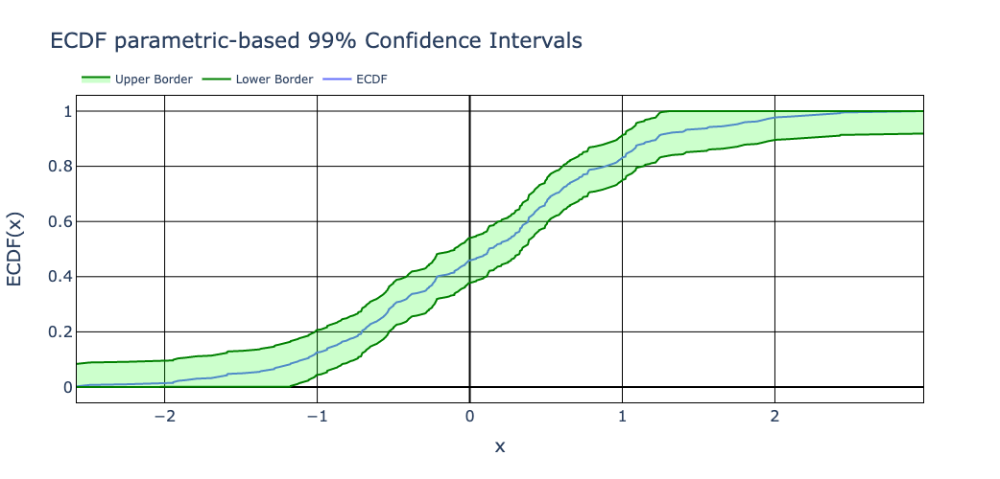

In [19]:
## Significance level to build 99% confidence intervals
alpha = 0.01

## Calculating ECDF borders
df = dkw_inequality(sample, alpha=alpha)
display(df.head())

fig = go.Figure(go.Scatter(
    x=df["value"],
    y=df["ecdf"],
    name="ECDF"
))

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ci_l"],
    name="Lower Border",
    line_color="green"
))

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ci_u"],
    name="Upper Border",
    line_color="green",
    fill='tonexty',
    fillcolor="rgba(0, 255, 0, 0.2)",
))

fig.update_layout(
    title=f"ECDF parametric-based {int((1-alpha)*100)}% Confidence Intervals",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    xaxis=dict(
        title="x",
        gridcolor="black", 
        zerolinecolor="black",
        mirror=True,
        linecolor="black",
        showline=True,
    ),
    yaxis=dict(
        title="ECDF(x)",
        gridcolor="black", 
        zerolinecolor="black",
        linecolor="black",
        showline=True,
        mirror=True
    ),
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)
fig.show()

### Case with Mechanics

Sample 1 mean: 2.2615 
Sample 2 mean: 2.331 

Sample 1 median: 2.0 
Sample 2 median: 2.0
Ttest_indResult(statistic=-1.629692765072511, pvalue=0.10324522513934309)
MannwhitneyuResult(statistic=1891470.0, pvalue=0.0019644386870768197)


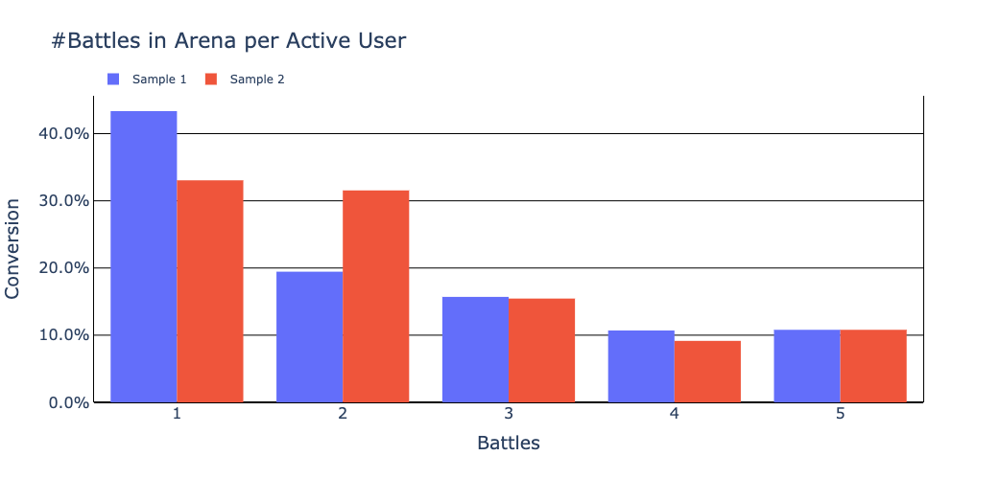

In [20]:
np.random.seed(43)

## Samples parameters
values = [1, 2, 3, 4, 5]
prob_1 = [0.45, 0.2, 0.15, 0.1, 0.1]
prob_2 = [0.35, 0.3, 0.15, 0.1, 0.1]

## Generating samples
sample_1 = np.random.choice(values, size=2000, p=prob_1)
sample_2 = np.random.choice(values, size=2000, p=prob_2)

## Simple Mean, Median and T-Test Mann-Whitney U Test output
print(
    f"Sample 1 mean: {sample_1.mean()}",
    f"\nSample 2 mean: {sample_2.mean()}",
    f"\n\nSample 1 median: {np.median(sample_1)}",
    f"\nSample 2 median: {np.median(sample_2)}"
)

print(ttest_ind(sample_1, sample_2))
print(mannwhitneyu(sample_1, sample_2))

## Creating plotly canvas with Distribution Histograms
fig = go.Figure(go.Histogram(
    x=sample_1,
    name="Sample 1"
))

fig.add_trace(go.Histogram(
    x=sample_2,
    name="Sample 2"
))

## Making it looks good (plotly layout reference)
fig.update_traces(histnorm="probability")
fig.update_layout(
    title=f"#Battles in Arena per Active User",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    xaxis=dict(title="Battles"),
    yaxis=dict(
        title="Conversion",
        gridcolor="black", 
        zerolinecolor="black",
        linecolor="black",
        showline=True,
        mirror=True,
        tickformat=".1%"
    ),
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)
fig.show()

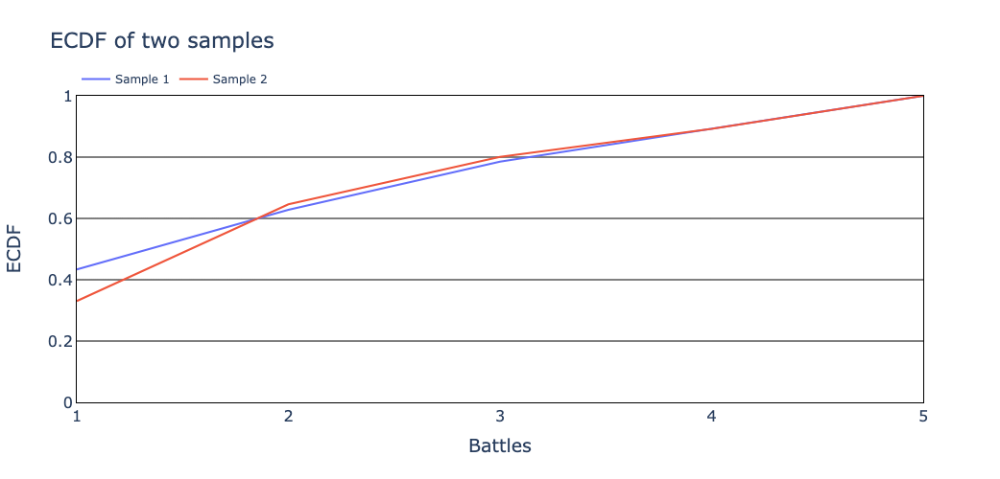

In [21]:
x = sorted(sample_1)
y = ECDF(sample_1)(x)

## Creating Figure with ECDF trace
fig = go.Figure(go.Scatter(
    x=x,
    y=y,
    name="Sample 1"
))

## Calculating Theoretical CDF
x = sorted(sample_2)
y = ECDF(sample_2)(x)

## Adding CDF trace 
fig.add_trace(go.Scatter(
    x=x,
    y=y,
    name="Sample 2"
))

## Updating layout to fix grid axis (I hate this so much)
fig.update_layout(
    title="ECDF of two samples",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    xaxis=dict(
        title="Battles",
        gridcolor="white",
        zerolinewidth=1,
        mirror=True,
        linecolor="black",
        showline=True,
        dtick=1
    ),
    yaxis=dict(
        title="ECDF",
        gridcolor="black", 
        zerolinecolor="black",
        zerolinewidth=1,
        linecolor="black",
        showline=True,
        mirror=True,
        range=[0, 1]
    ),
    width=1000,
    height=500,
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)
fig.show()

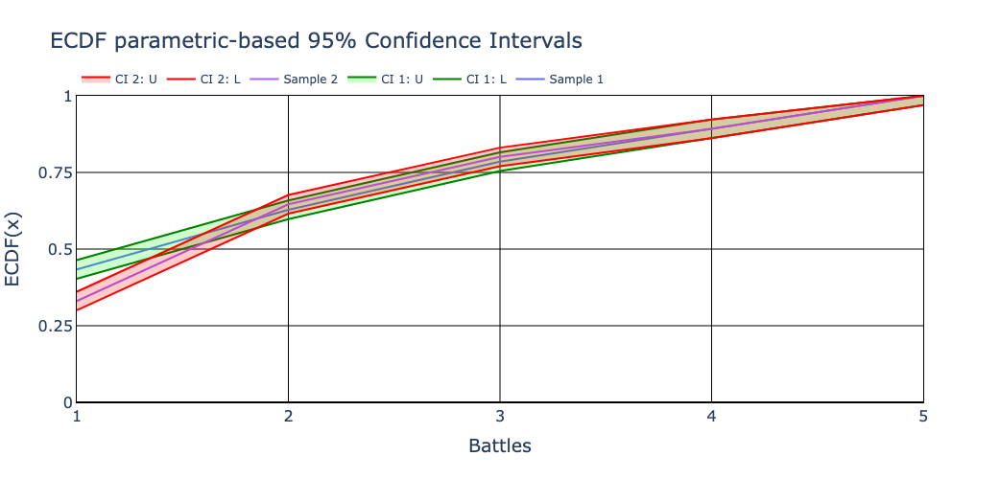

In [22]:
alpha = 0.05

## Case with sample 1
df = dkw_inequality(sample_1, alpha=alpha)

fig = go.Figure(go.Scatter(
    x=df["value"],
    y=df["ecdf"],
    name="Sample 1"
))

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ci_l"],
    name="CI 1: L",
    line_color="green"
))

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ci_u"],
    name="CI 1: U",
    line_color="green",
    fill='tonexty',
    fillcolor="rgba(0, 255, 0, 0.2)",
))

## Case with sample 2

df = dkw_inequality(sample_2, alpha=alpha)

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ecdf"],
    name="Sample 2"
))

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ci_l"],
    name="CI 2: L",
    line_color="red"
))

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ci_u"],
    name="CI 2: U",
    line_color="red",
    fill='tonexty',
    fillcolor="rgba(255, 0, 0, 0.2)",
))

fig.update_layout(
    title=f"ECDF parametric-based {int((1-alpha)*100)}% Confidence Intervals",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    xaxis=dict(
        title="Battles",
        gridcolor="black", 
        zerolinecolor="black",
        mirror=True,
        linecolor="black",
        showline=True,
        dtick=1
    ),
    yaxis=dict(
        title="ECDF(x)",
        gridcolor="black", 
        zerolinecolor="black",
        linecolor="black",
        showline=True,
        mirror=True,
        range=[0, 1],
        dtick=0.25
    ),
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)
fig.show()

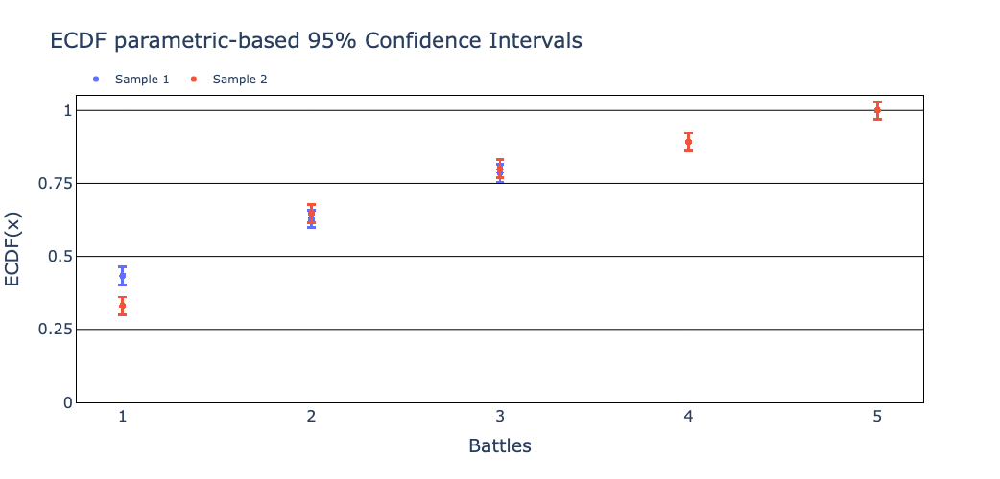

In [23]:
alpha = 0.05

## Case with sample 1
df = dkw_inequality(sample_1, alpha=alpha)

fig = go.Figure(go.Scatter(
    x=df["value"],
    y=df["ecdf"],
    error_y=dict(array=df["error"]),
    mode="markers",
    name="Sample 1"
))

## Case with sample 2

df = dkw_inequality(sample_2, alpha=alpha)

fig.add_trace(go.Scatter(
    x=df["value"],
    y=df["ecdf"],
    error_y=dict(array=df["error"]),
    mode="markers",
    name="Sample 2"
))

fig.update_layout(
    title=f"ECDF parametric-based {int((1-alpha)*100)}% Confidence Intervals",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    xaxis=dict(
        title="Battles",
        gridcolor="white", 
        zerolinecolor="black",
        mirror=True,
        linecolor="black",
        showline=True,
        dtick=1
    ),
    yaxis=dict(
        title="ECDF(x)",
        gridcolor="black", 
        zerolinecolor="black",
        linecolor="black",
        showline=True,
        mirror=True,
        range=[0, 1.05],
        dtick=0.25
    ),
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)
fig.show()

## Function of Random Variable

### Visualising the case

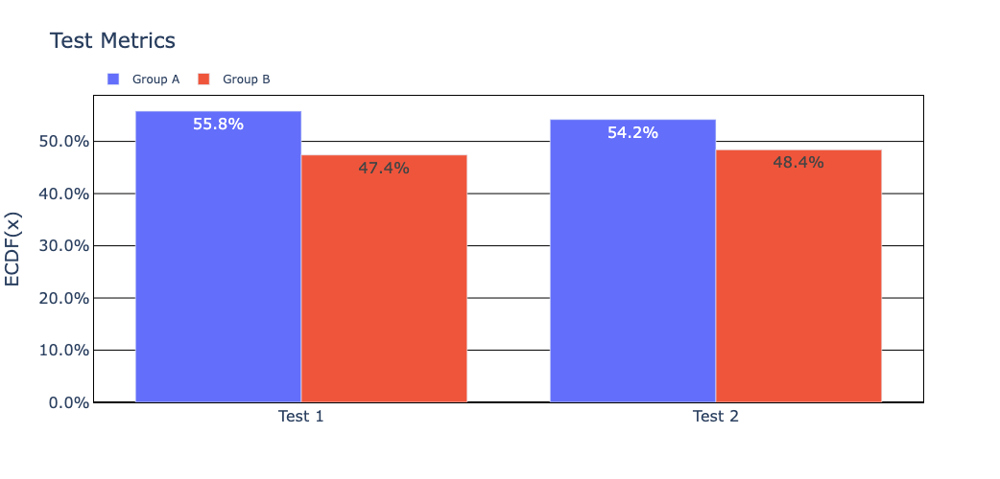

In [24]:
## Creating Figure for the first results
p1 = 0.558
p2 = 0.542

fig = go.Figure(go.Bar(
    x=["Test 1", "Test 2"],
    y=[p1, p2],
    name="Group A",
    text=[p1, p2],
    textposition='auto',
    texttemplate='%{text:.1%}'
))

## Adding trace with second results

p1 = 0.474
p2 = 0.484

fig.add_trace(go.Bar(
    x = ["Test 1", "Test 2"],
    y = [p1, p2],
    name = "Group B",
    text=[p1, p2],
    textposition='auto',
    texttemplate='%{text:.1%}'
))

fig.update_layout(
    title=f"Test Metrics",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    xaxis=dict(
        gridcolor="white", 
        zerolinecolor="black",
        mirror=True,
        linecolor="black",
        showline=True,
        dtick=1
    ),
    yaxis=dict(
        title="ECDF(x)",
        gridcolor="black", 
        zerolinecolor="black",
        linecolor="black",
        showline=True,
        mirror=True,
        tickformat=".1%"
    ),
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)

fig.show()

### Defining Farrington-Manning Test Function

In [25]:
def farrington_manning(obs, success, ratio, alpha=0.01, 
                       alternative = "two-sided", show=False):
    ##########################################
    ## INITIALIZING LIBRARIES AND FUNCTIONS ##
    ##########################################
    from scipy.stats import norm
    import pandas as pd
    import numpy as np
    
    def add_statistic(fig, x, area, name = "statistic AUC"):
        
        fig = fig.add_trace(go.Scatter(
            x = x,
            y = norm.pdf(x),
            fill = "tozeroy",
            fillcolor = "#EF553B",
            hoveron = "points+fills",
            text = "AUC: " + str(round(area, 5)),
            hoverinfo = "text",
            line_color = "#636EFA",
            name = name
        ))
        
        return(fig)
    
    ## Null hypothesis: p1 = p2*value (or p1/p2 = value)
    ## Alternative can be "greater", "less" or "two-sided"
    ## Observed probabilities of success
    p1 = success[0]/obs[0]
    p2 = success[1]/obs[1]
    
    ## The ratio between sample sizes
    theta = obs[1]/obs[0]
    
    ## Parameters needed for probabilities estimation
    ## Under assumption of true NULL hypothesis
    a = 1 + theta
    b = - (ratio * (1 + theta*p2) + theta + p1)
    c = ratio*(p1 + theta*p2)

    ## Estimating true probabilities via MLE
    p1_r = (-b - np.sqrt(np.power(b, 2) - 4*a*c)) / (2*a)
    p2_r = p1_r/ratio

    ## Variance of Z-statistics under the TRUE null hypothesis
    wo = (p1_r*(1-p1_r) + np.power(ratio, 2)/theta * p2_r*(1 - p2_r))/obs[0]
    
    statistic = np.power((p1 - ratio*p2), 2)/wo
    
    p_less = norm.cdf(statistic)
    p_greater = 1 - norm.cdf(statistic)
    p_twosided = 2 * min(p_less, p_greater)
    
    if alternative == "greater": 
        p_value = p_greater
    elif alternative == "less": 
        p_value = p_less
    else: 
        p_value = p_twosided
    
    ######################
    ## FULL INFO OUTPUT ##
    ######################
    if show:
        import matplotlib.pyplot as plt
        import plotly.graph_objs as go
        
        x_max = norm.ppf(1 - alpha/2)
        area = norm.cdf(x_max) - norm.cdf(-x_max)
        
        x = np.linspace(-x_max, x_max, 500)
        
        fig = go.Figure(go.Scatter(
            x = x,
            y = norm.pdf(x),
            mode = "lines",
            name = "Statistic Distribution"
        )).update_layout(
            title = "Standard Gaussian distribution AUC = " + str(round(area, 5)),
            xaxis = dict(title = "x"),
            yaxis = dict(title = "f(x) = PDF[x] (0, 1)"),
        )
        
        #######################################
        ## RENDERING CHANGES FROM HYPOTHESIS ##
        #######################################
        
        ## Greater
        if (alternative == "greater") & (statistic <= x_max):
            area = norm.cdf(statistic) - norm.cdf(-10) 
            x = np.linspace(-x_max, statistic, 50)
            fig = add_statistic(fig, x, area, name = "Greater")
        
        ## Less
        elif (alternative == "less") & (statistic <= x_max):
            area = norm.cdf(10) - norm.cdf(statistic)
            x = np.linspace(statistic, x_max, 50)
            fig = add_statistic(fig, x, area, name = "Less")
        
        ## Two-sided
        elif abs(statistic) <= x_max: 
            alternative = "two-sided"
            area = norm.cdf(-abs(statistic)) - norm.cdf(-10)
            x = np.linspace(-x_max, -abs(statistic), 50)
            fig = add_statistic(fig, x, area, name = "Critical area: Less")
            
            x = np.linspace(abs(statistic), x_max, 50)
            fig = add_statistic(fig, x, area, name = "Critical area: Greater")
        
        print(
            "Probability of sample 1: %.5f" %p1,
            "\nProbability of sample 2: %.5f" %p2,
            "\nSeeking Ratio: %.5f" %ratio,
            "\np1/p2: %.5f" %(p1/p2),
            f"\nAlternative: {alternative}",
            "\n-------------------------------",
            "\nTest statistic: %.6f" %statistic,
            "\nP-value: %.6f" %p_value
        )
        
        fig.show();
        return(p_value, fig)
        
    ##################
    ## BASIC OUTPUT ##
    ##################
    else: print(
        "Null hypothesis: p1 = p2 * Ratio",
        "\n--------------------------------",
        "\nTest statistic: %.5f" %statistic,
        "\nP-value: %.5f" %p_value
    )
    
    return([statistic, p_value])

### Creating sampled data

Probability of sample 1: 0.48390 
Probability of sample 2: 0.54191 
Seeking Ratio: 0.84946 
p1/p2: 0.89294 
Alternative: greater 
------------------------------- 
Test statistic: 10.189847 
P-value: 0.000000


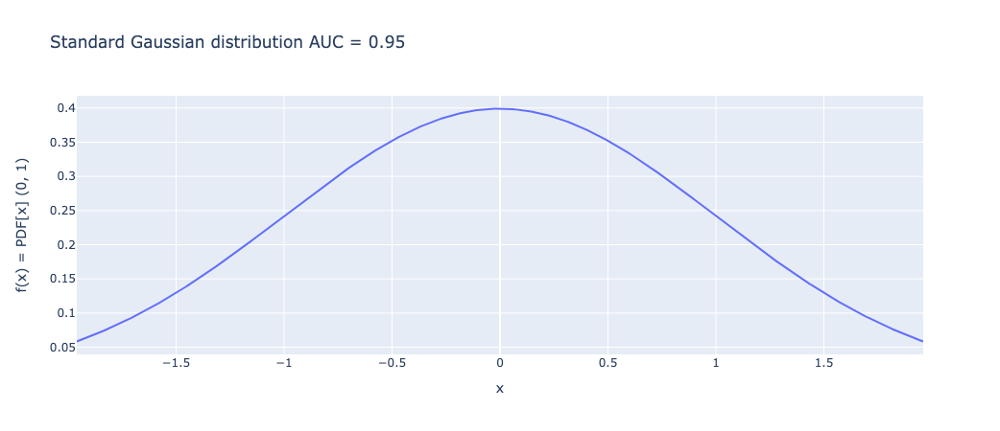

In [26]:
## Test 2 conversion
p_a = 0.542
p_b = 0.484

## Ratio we are comparing samples to
r = 0.474/0.558

## The size of samples
size_a = 8470
size_b = 7452

## Amount of success to get the needed probabilities
success_a = int(size_a*p_a)
success_b = int(size_b*p_b)

p_value, fig = farrington_manning(
    obs=[size_b, size_a],
    success=[success_b, success_a],
    ratio=r,
    alpha=0.05,
    alternative="greater",
    show=True
);

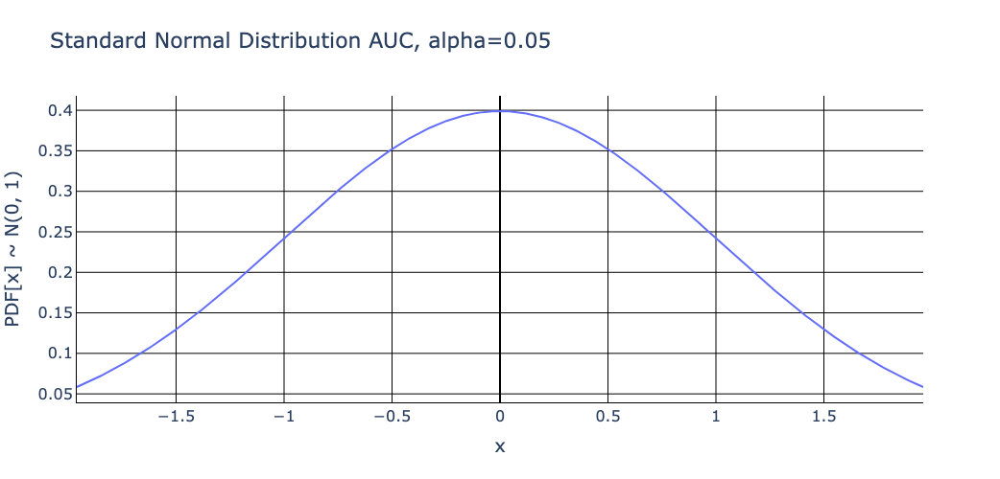

In [27]:
fig.update_layout(
    title=f"Standard Normal Distribution AUC, alpha=0.05",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(size=16),
    width=1000,
    height=500,
    xaxis=dict(
        gridcolor="black", 
        zerolinecolor="black",
        linecolor="black",
        showline=True,
        dtick=0.5
    ),
    yaxis=dict(
        title="PDF[x] ~ N(0, 1)",
        gridcolor="black", 
        zerolinecolor="black",
        linecolor="black",
        showline=True
    ),
    legend=dict(orientation="h", y=1.1, font=dict(size=12))
)